Uploading the dataset

In [ ]:
from google.colab import  files
uploaded = files.upload()

Saving MRI+T1_T2+Dataset.RAR to MRI+T1_T2+Dataset.RAR


In [ ]:
!unrar x "MRI+T1_T2+Dataset.RAR"


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from MRI+T1_T2+Dataset.RAR

Creating    Tr1                                                       OK
Extracting  Tr1/.DS_Store                                                  0%  OK 
Creating    Tr1/TrainT1                                               OK
Extracting  Tr1/TrainT1/Image #10.png                                      1%  OK 
Extracting  Tr1/TrainT1/Image #11.png                                      2%  OK 
Extracting  Tr1/TrainT1/Image #12.png                                      3%  OK 
Extracting  Tr1/TrainT1/Image #13.png                                      4%  OK 
Extracting  Tr1/TrainT1/Image #14.png                                      5%  OK 
Extracting  Tr1/TrainT1/Image #15.png                                      6%  OK 
Extracting  Tr1/TrainT1/Image #16.png                                      7%  OK 
Extracting

## Pipeline
1. Importing Libraries
2. Data Loading and Visualization
3. Data Preprocessing
4. Model Building
5. Model Training
6. Generating a GIF

# Importing Libraries

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib
import skimage
import matplotlib.pyplot as plt
from skimage.transform import resize
from keras.utils.vis_utils import plot_model
import imageio
import glob
import os
from PIL import Image

<h1> Version of Libraries </h1>

In [ ]:
print(" Numpy - \t",np.__version__, "\n", "Tensorflow - \t", tf.__version__ ,"\n", \
      "Matplotlib - \t",matplotlib.__version__, "\n", "Skimage - \t", skimage.__version__)

 Numpy - 	 1.21.5 
 Tensorflow - 	 2.8.0 
 Matplotlib - 	 3.2.2 
 Skimage - 	 0.18.3


### Loading Data

Weighted T1 MRI images = img1\
Weighted T2 MRI images = img2

Loading MRI images of type 1

In [ ]:
img1 = []
try:
  for file in sorted(os.listdir("./Tr1/TrainT1")):
    filename = os.path.join("./Tr1/TrainT1", file)
    image = Image.open(filename)
    image = np.array(image)
    image = image/127.5 - 1.0
    img1.append(image)
  img1 = np.array(img1)
except:
  print("No such file or direcrtory")

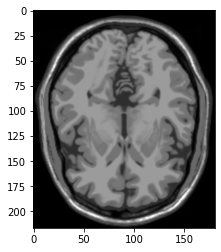

In [ ]:
plt.imshow(img1[0], cmap= 'gray')
plt.show()

Loading MRI images of type 2

In [ ]:
img2 = []
try:
  for file in sorted(os.listdir("./Tr2/TrainT2")):
    filename = os.path.join("./Tr2/TrainT2", file)
    image = Image.open(filename)
    image = np.array(image)
    image = image/127.5 - 1.0
    img2.append(image)
  img2 = np.array(img2)
except:
  print("No such file or direcrtory")

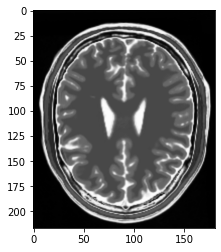

In [ ]:
plt.imshow(img2[0], cmap= 'gray')
plt.show()

Plotting both type of MRI scans side by side

In [ ]:
from importlib import reload
plt = reload(plt)           #reloading plt

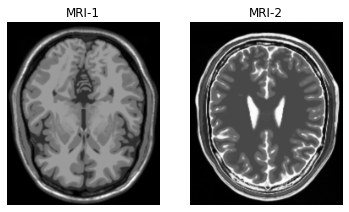

In [ ]:
title = ["MRI-1", "MRI-2"]
imgs = [img1[0], img2[0]]
for i in range(len(imgs)):
  plt.subplot(1,2,i+1)
  plt.title(title[i])
  plt.imshow(imgs[i], cmap = 'gray')
  plt.axis('off')
plt.show()

## Data Preprocessing


1.   Data Resizing
2.   Data Reshaping
3.   Batch and Shuffle Data

In [ ]:
dim = (128, 128)

### Data Resizing

In [ ]:
mri1_data = np.zeros((img1.shape[0], dim[0], dim[1]))
for ind, img in enumerate(img1):
  mri1_data[ind,:,:] = resize(img, dim)
mri1_data.shape


(43, 128, 128)

In [ ]:
mri2_data = np.zeros((img2.shape[0], dim[0], dim[1]))
for ind, img in enumerate(img2):
  mri2_data[ind,:,:] = resize(img, dim)
mri2_data.shape

(46, 128, 128)

Reshaping into 32 - 32- 1 and float type

In [ ]:
mri1_data = mri1_data.reshape(mri1_data.shape[0], dim[0], dim[1],1).astype('float32')
mri2_data = mri2_data.reshape(mri2_data.shape[0], dim[0], dim[1],1).astype('float32')

Batch and shuffle the data

In [ ]:
BATCH_SIZE = 5

In [ ]:
mri1_data = tf.data.Dataset.from_tensor_slices(mri1_data).shuffle(img1.shape[0], seed=42).batch(BATCH_SIZE)
mri2_data = tf.data.Dataset.from_tensor_slices(mri2_data).shuffle(img2.shape[0], seed=42).batch(BATCH_SIZE)

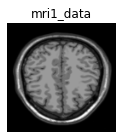

In [ ]:
sample_mri1_data = next(iter(mri1_data))
plt.figure(figsize=(2, 2))
plt.imshow(sample_mri1_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('mri1_data')
plt.axis('off')
plt.show()

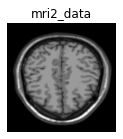

In [ ]:
sample_mri2_data = next(iter(mri2_data))
plt.figure(figsize=(2, 2))
plt.imshow(sample_mri1_data[0].numpy()[:, :, 0], cmap='gray')
plt.title('mri2_data')
plt.axis('off')
plt.show()

### Model Building
1. Instance Normalization
2. Downsampling, Upsampling and Unet
3. Generator Building using Unet
4. Discriminator Building

#### Instance Normalization
Instance Normalization are specially used with Style Transfer, where Separate Normalization is performed for each sample we perform channelwise Normalization.

In [ ]:
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

#### Downsampling
Downsampling is performed using the Convolution, leading to reduce in dimensions.

In [ ]:
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

#### Upsampling
Upsampling is a result of Transposed Convolution, where dimension of image are increased.

In [ ]:
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

#### Unets
Unets takes Image as an input and translate it into another Image. <p>
To do this they first use Downsampling on Input Image to learn the latent characteristics of Input Image and then use Upsampling to use this knowledge to Translate it into another Image.

In [ ]:
# Unet Generator is a combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(64, 4, False), # (bs, 16, 16, 64)
        downsample(128, 4), # (bs, 8, 8, 128)
        downsample(128, 4), # (bs, 4, 4, 128)
        downsample(128, 4), # (bs, 2, 2, 128)
        downsample(128, 4) # (bs, 1, 1, 128)
    ]
    up_stack = [
        upsample(128, 4, True), # (bs, 2, 2, 256)
        upsample(128, 4, True), # (bs, 4, 4, 256)
        upsample(128, 4), # (bs, 8, 8, 256)
        upsample(64, 4) # (bs, 16, 16, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 32, 32, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[dim[0], dim[1], 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Generator
Generator is a Unet Network here since We want to translate One type of Image (MRI-1) into Another type of Image (MRI-2).

In [ ]:
generator_g = unet_generator()
generator_f = unet_generator()

Summary

In [ ]:
generator_g.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential_22 (Sequential)     (None, 64, 64, 64)   1024        ['input_3[0][0]']                
                                                                                                  
 sequential_23 (Sequential)     (None, 32, 32, 128)  131328      ['sequential_22[0][0]']          
                                                                                                  
 sequential_24 (Sequential)     (None, 16, 16, 128)  262400      ['sequential_23[0][0]']    

#### Discriminator
Discriminator is a traditional CNN, which we use to classify the Images. It only uses Downsampling hence.

Both Discriminators have same architecture

In [ ]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is not used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (32, 32, 1)
    inp = tf.keras.layers.Input(shape=[dim[0], dim[1], 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(64, 4, False)(x) # (bs, 16, 16, 64)
    down2 = downsample(128, 4)(down1) # (bs, 8, 8, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2) # (bs, 10, 10, 128)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(256, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 7, 7, 256)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 9, 9, 256)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 6, 6, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [ ]:
discriminator_x = discriminator()
discriminator_y = discriminator()

In [ ]:
discriminator_x.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 128, 128, 1)]     0         
                                                                 
 sequential_44 (Sequential)  (None, 64, 64, 64)        1024      
                                                                 
 sequential_45 (Sequential)  (None, 32, 32, 128)       131328    
                                                                 
 zero_padding2d_8 (ZeroPaddi  (None, 34, 34, 128)      0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 31, 31, 256)       524288    
                                                                 
 instance_normalization_41 (  (None, 31, 31, 256)      512       
 InstanceNormalization)                                    

### Model Training
1. Declare Loss type
2. Calculate Discriminator Loss
3. Calculate Generator Loss
4. Cycle Loss
5. Identity Loss
6. Optimizer
7. Checkpoint Initialization
8. Training Flow

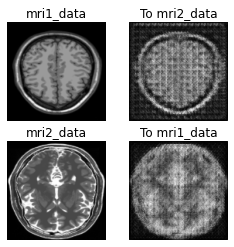

In [ ]:
to_mri2_data = generator_g(sample_mri1_data)
to_mri1_data = generator_f(sample_mri2_data)
plt.figure(figsize=(4, 4))

imgs = [sample_mri1_data, to_mri2_data, sample_mri2_data, to_mri1_data]
title = ['mri1_data', 'To mri2_data', 'mri2_data', 'To mri1_data']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Declare Loss as Binary Cross Entropy
Since Our Discriminator is a classifier

In [ ]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

#### Discriminator Loss
It consists of two types of losses
1.    Loss on Real Data
2.    Loss on Fake Data

In [ ]:
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

#### Generator Loss
It has only one type of loss - Discriminator Loss on Generated data

In [ ]:
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

#### Cycle Loss

In [ ]:
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

#### Identity Loss

In [ ]:
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

#### Optimizer 
We use Adam Optimizer to update weights which is a good optimizer to achieve quick learning.

In [ ]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

Epochs?

In [ ]:
EPOCHS = 100

#### Checkpoint Initialization
Initialize checkpoints to save models

In [ ]:
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


Function to show Images output by Generators while Training

In [ ]:
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Predicted Image', 'Input Image', 'Predicted Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

Sequence of Training Flow


1.   Generate Fake Y and Cycled X
2.   Generate Fake X and Cycled Y
3.   Generate Fake Images through G and F for Identity Loss.
4.   Calculate Discriminator Loss for Disc X and Disc Y on Fake Data for Generator Training.
5.   Calculate Generator Loss on Discriminator.
6.   Calculate Cycled Loss on Cycled Images from step 1 and 2.
7.   Calculate Total Generator Loss - Disc Loss + Cycled Loss + Identity Loss
8.   Calculate Discriminator Loss on both Fake and Real Images for Disc X and Y for Disc Training.
9.   Calculate the Gradients and update the weight and bias of models.

In [ ]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

train

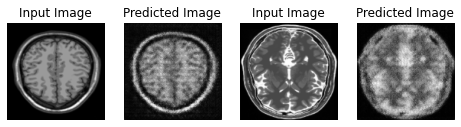

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-11


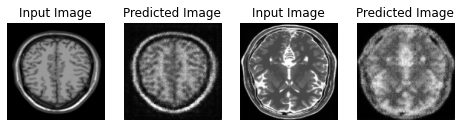

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-12


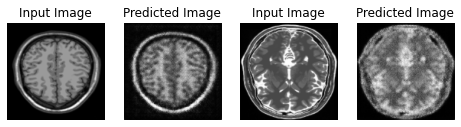

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-13


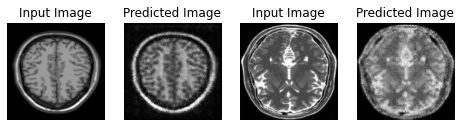

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-14


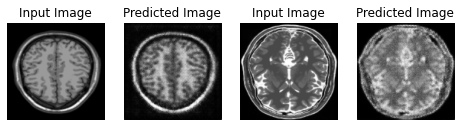

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-15


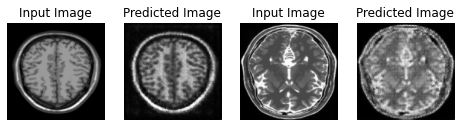

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-16


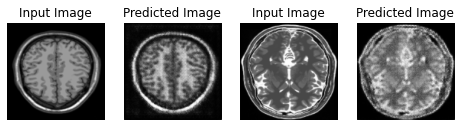

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-17


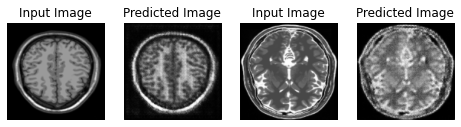

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-18


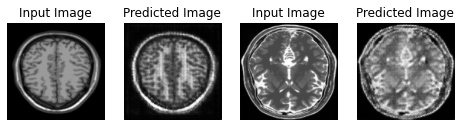

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-19


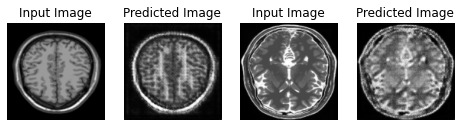

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-20


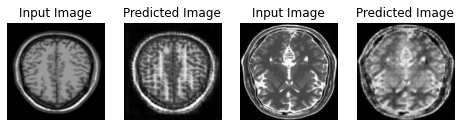

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-21


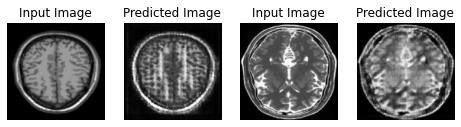

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-22


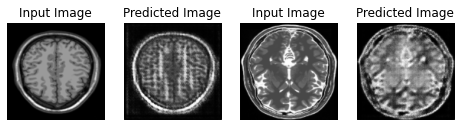

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-23


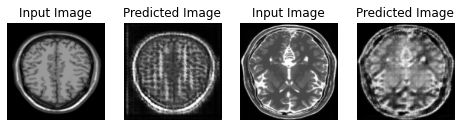

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-24


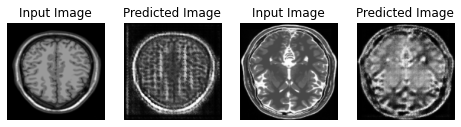

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-25


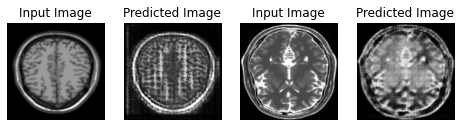

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-26


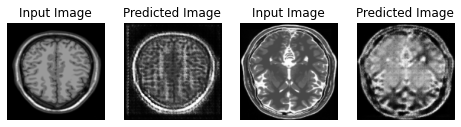

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-27


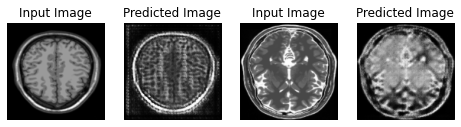

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-28


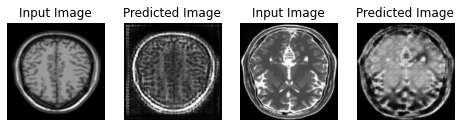

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-29


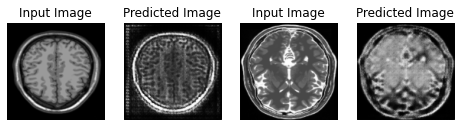

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-30


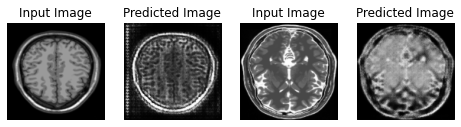

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-31


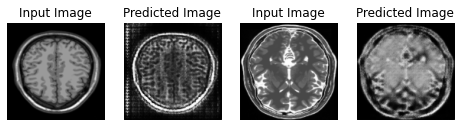

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-32


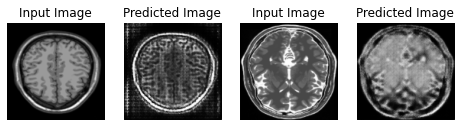

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-33


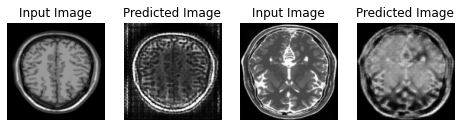

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-34


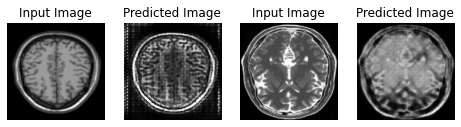

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-35


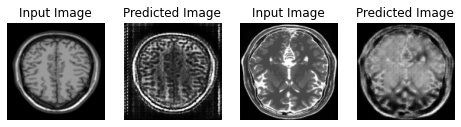

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-36


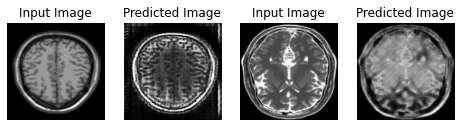

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-37


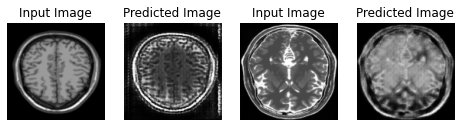

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-38


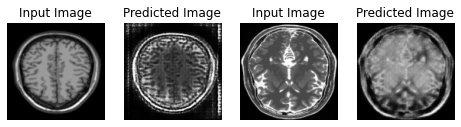

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-39


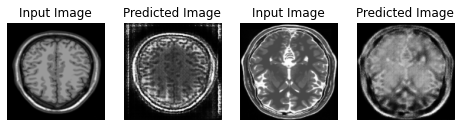

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-40


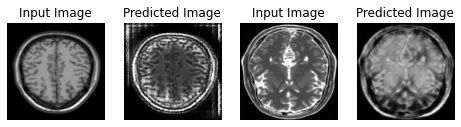

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-41


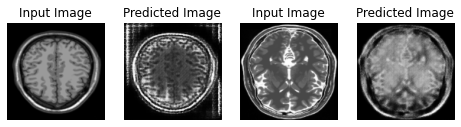

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-42


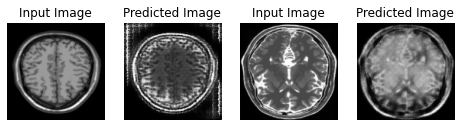

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-43


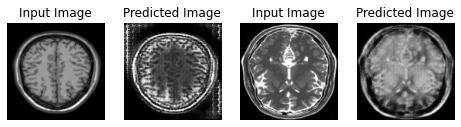

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-44


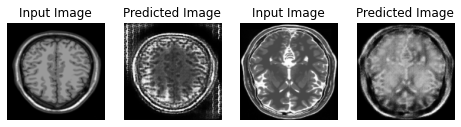

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-45


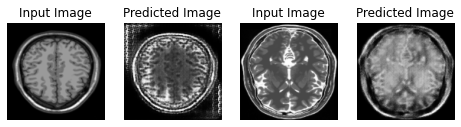

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-46


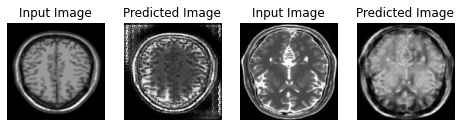

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-47


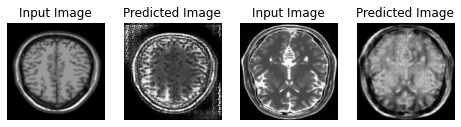

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-48


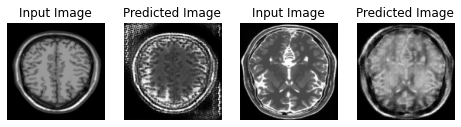

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-49


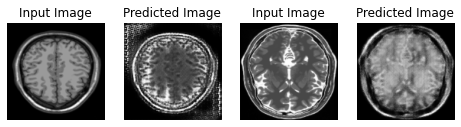

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-50


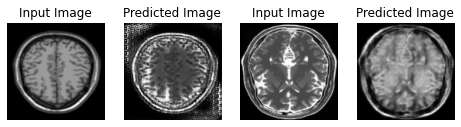

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-51


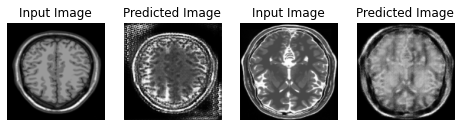

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-52


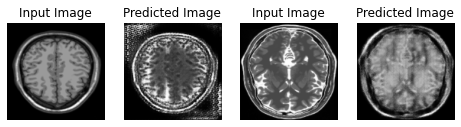

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-53


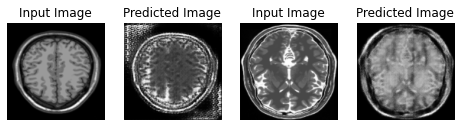

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-54


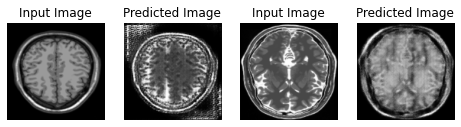

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-55


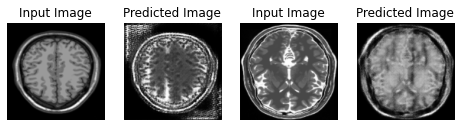

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-56


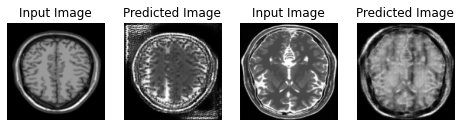

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-57


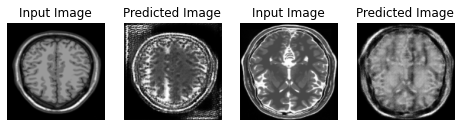

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-58


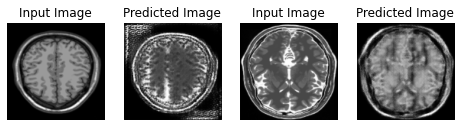

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-59


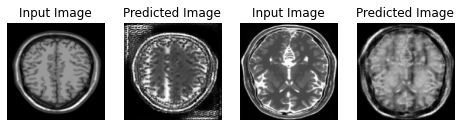

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-60


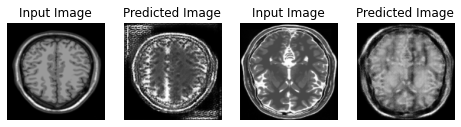

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-61


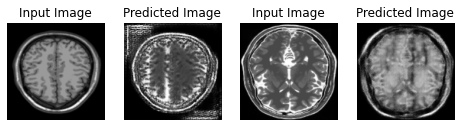

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-62


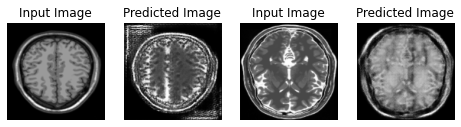

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-63


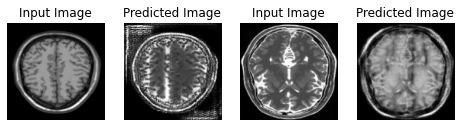

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-64


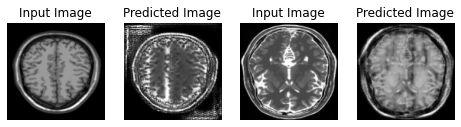

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-65


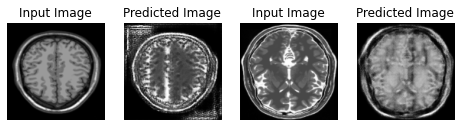

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-66


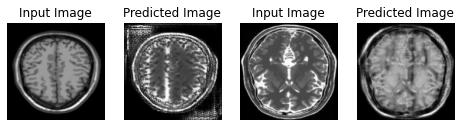

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-67


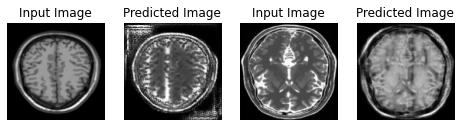

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-68


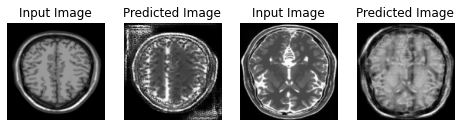

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-69


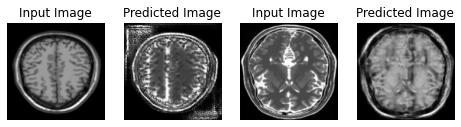

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-70


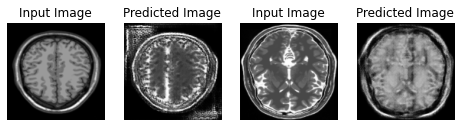

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-71


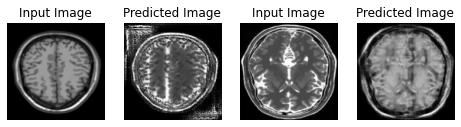

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-72


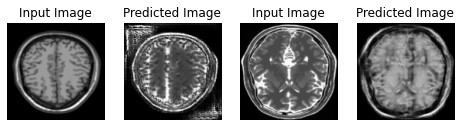

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-73


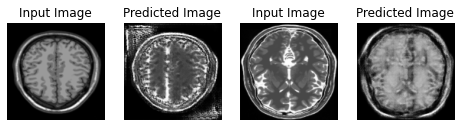

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-74


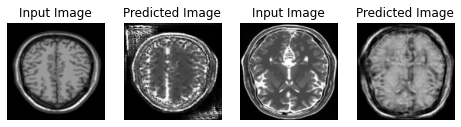

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-75


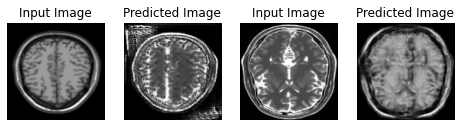

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-76


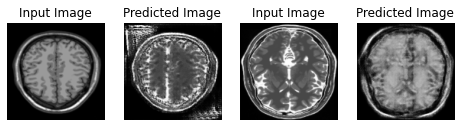

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-77


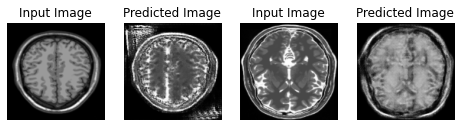

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-78


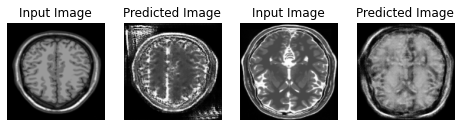

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-79


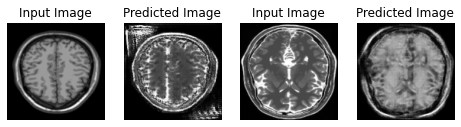

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-80


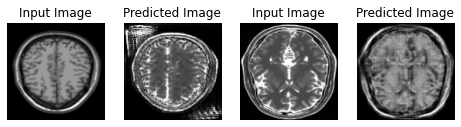

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-81


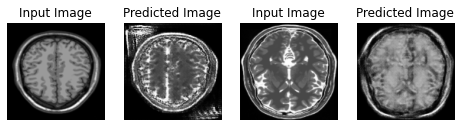

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-82


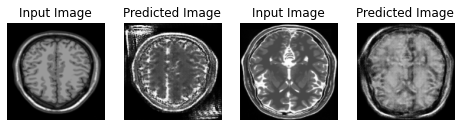

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-83


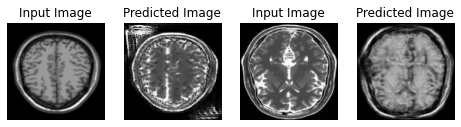

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-84


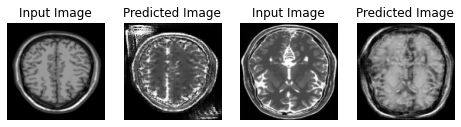

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-85


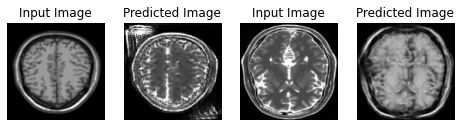

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-86


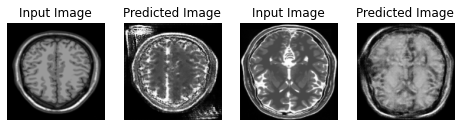

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-87


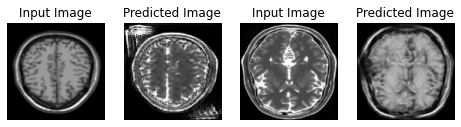

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-88


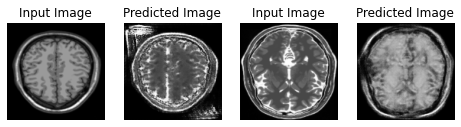

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-89


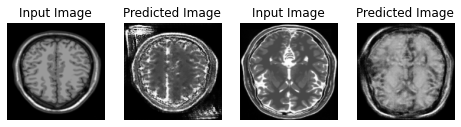

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-90


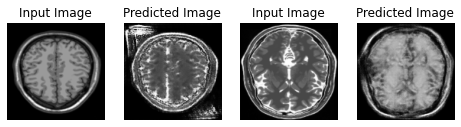

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-91


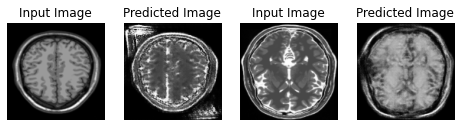

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-92


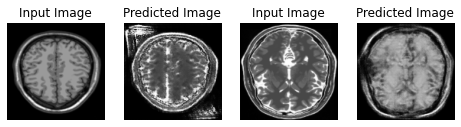

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-93


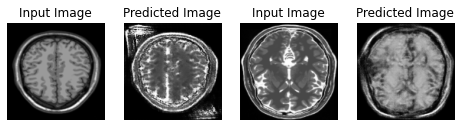

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-94


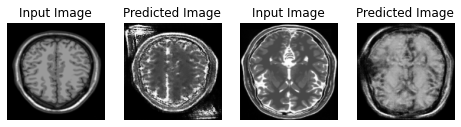

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-95


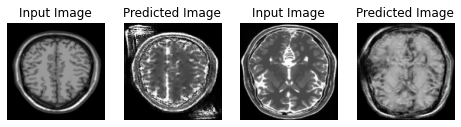

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-96


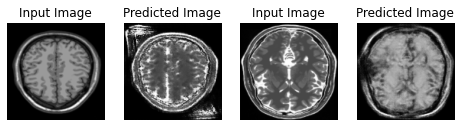

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-97


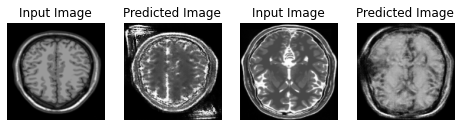

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-98


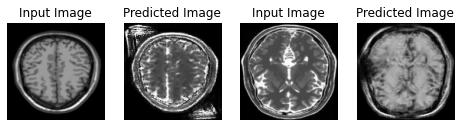

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-99


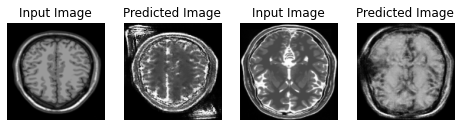

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-100


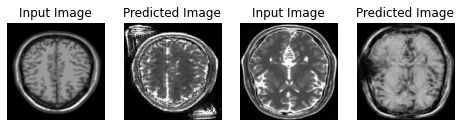

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-101


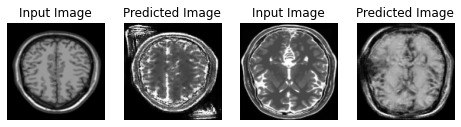

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-102


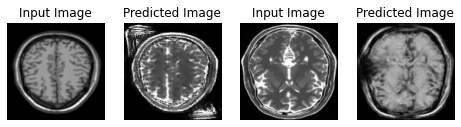

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-103


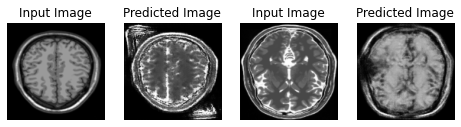

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-104


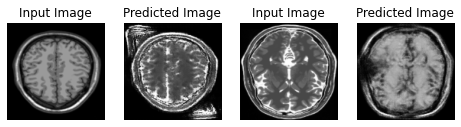

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-105


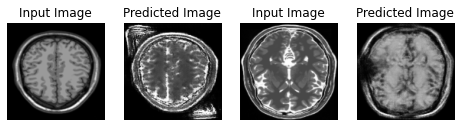

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-106


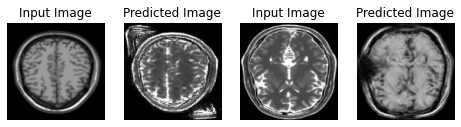

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-107


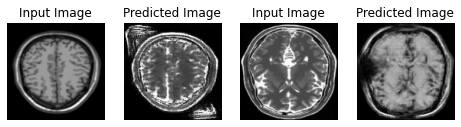

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-108


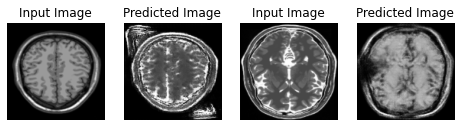

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-109


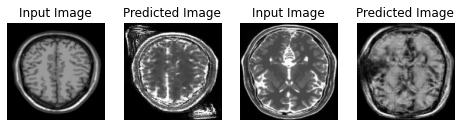

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-110


In [ ]:
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((mri1_data, mri2_data)):
        train_step(image_x, image_y)
    generate_images(generator_g, sample_mri1_data, generator_f, sample_mri2_data)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

In [ ]:
anim_file = 'cyclegan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

In [ ]:
pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-ahwuejfp
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-ahwuejfp



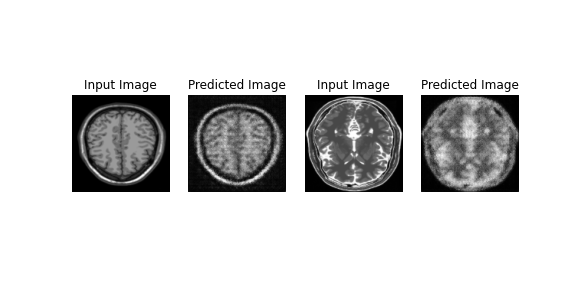

In [ ]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)